# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './input/'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

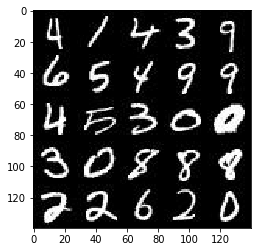

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

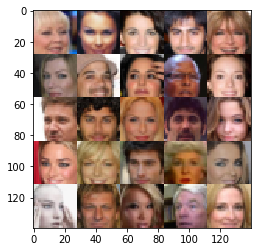

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width  --> 28
    :param image_height: The input image height --> 28
    :param image_channels: The number of image channels --> 3
    :param z_dim: The dimension of Z --> 100
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    tensor_real_imput_img = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    tensor_z_data = tf.placeholder(tf.float32, shape=(None, z_dim))
    learning_rate = tf.placeholder(tf.float32)

    return (tensor_real_imput_img, tensor_z_data, learning_rate)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)--> Tensor("Placeholder:0", shape=(?, 28, 28, 3), dtype=float32)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # input layer --> 28, 28, 3
        
        start_dim = 28*2
        kernel_sz = 5
        strides = 2

        layer_0 = tf.layers.conv2d(images, start_dim, kernel_sz, strides=strides, padding='same', 
                                   kernel_initializer=tf.contrib.layers.xavier_initializer(uniform=True,
                                                                                          seed=None,
                                                                                          dtype=tf.float32
                                                                                          )
                                  )
        relu_0 = tf.maximum(alpha * layer_0, layer_0)
        #14*14*56
        
        layer_1 = tf.layers.conv2d(relu_0, start_dim*2, kernel_sz, strides=strides, padding='same')
        batchnorm_1 = tf.layers.batch_normalization(layer_1, training=True)
        relu_1 = tf.maximum(alpha * batchnorm_1, batchnorm_1)
        #  7, 7, 112
        
        layer_2 = tf.layers.conv2d(relu_1, start_dim*4, kernel_sz, strides=strides, padding='same')
        batchnorm_2 = tf.layers.batch_normalization(layer_2, training=True)
        relu_2 = tf.maximum(alpha * batchnorm_2, batchnorm_2)
        #4, 4, 224
        
        layer_3 = tf.layers.conv2d(relu_2, start_dim*8, kernel_sz, strides=strides, padding='same')
        batchnorm_3 = tf.layers.batch_normalization(layer_2, training=True)
        relu_3 = tf.maximum(alpha * batchnorm_3, batchnorm_3)
        relu_3_d = tf.nn.dropout(relu_3, 0.8)
        #4, 4, 224
        
        flatten = tf.reshape(relu_3_d, (-1, (start_dim*4)*4*4)) 
            
        logits = tf.layers.dense(flatten, 1)
        output = tf.sigmoid(logits)

    return (output, logits)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z --> Tensor("Placeholder:0", shape=(?, 100), dtype=float32)
    :param out_channel_dim: The number of channels in the output image --> 5
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        start_dim = 512
        kernel_sz = 5
        strides = 2

        layer_0 = tf.layers.dense(z, 7*7*start_dim)
    
        layer_0 = tf.reshape(layer_0, (-1, 7, 7, start_dim))
        layer_0 = tf.layers.batch_normalization(layer_0, training=is_train)
        # 7, 7, 512 
      
        layer_1 = tf.layers.conv2d_transpose(layer_0, int(start_dim/2), kernel_sz, 
                                             strides=strides, padding='same', 
                                             kernel_initializer=tf.contrib.layers.xavier_initializer(uniform=True,
                                                                                          seed=None,
                                                                                          dtype=tf.float32
                                                                                          )
                                            )
        layer_1 = tf.layers.batch_normalization(layer_1, training=is_train)
        relu_1 = tf.maximum(alpha * layer_1, layer_1)
        # 14, 14, 256
    
        layer_2 = tf.layers.conv2d_transpose(layer_1, int(start_dim/4), kernel_sz, strides=strides, padding='same')
        layer_2 = tf.layers.batch_normalization(layer_2, training=is_train)
        relu_2 = tf. maximum(alpha * layer_2, layer_2)
        # 28, 28, 128
        
        layer_3 = tf.layers.conv2d_transpose(layer_2, int(start_dim/8), kernel_sz, strides=strides, padding='same')
        layer_3 = tf.layers.batch_normalization(layer_3, training=is_train)
        relu_3 = tf. maximum(alpha * layer_3, layer_3)
        relu_3_d = tf.nn.dropout(relu_3, 0.8)
        # 28, 28, 128

    
        logits = tf.layers.conv2d_transpose(relu_3_d, out_channel_dim, kernel_sz, strides=strides, padding='same')
        logits = tf.reshape(logits, (-1, 28, 28, out_channel_dim))
        # 28, 28, 5
        output = tf.tanh(logits)
        
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    alpha = 0.2
    
    #generator with z input
    g_mod = generator(input_z, out_channel_dim, alpha=alpha)
    
    # discriminator with real input and g_mod output
    d_out_real, d_log_real = discriminator(input_real, alpha=alpha)
    d_out_fake, d_log_fake = discriminator(g_mod, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
                                tf.nn.sigmoid_cross_entropy_with_logits(
                                    logits=d_log_real,
                                    labels=tf.ones_like(d_out_real)*0.9
                                 ))
    
    d_loss_fake = tf.reduce_mean(
                                tf.nn.sigmoid_cross_entropy_with_logits(
                                logits=d_log_fake,
                                labels=tf.zeros_like(d_out_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_log_fake,
                                                                 labels=tf.ones_like(d_out_fake)))
    
    
    return (d_loss, g_loss)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer --> 0.9 (eg less than 1)
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    train_vars = tf.trainable_variables()
    
    #variable generators with shape (3,3), float32
    d_vars = [var for var in train_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in train_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_op = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_op = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=g_vars)

    return (d_train_op, g_train_op)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches,
          data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension --> 100
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data  --> (60000, 28, 28, 1)
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    steps = 0
    div_by = 20
    n_images = 10
    image_mode="RGB"
    samples=[]
    
    input_real, input_z, lr = model_inputs(data_shape[1], 
                                                      data_shape[2], 
                                                      data_shape[3], 
                                                      z_dim)
    # --> Tensor("Placeholder:0", shape=(?, 28, 28, 1), dtype=float32) 
    # Tensor("Placeholder_1:0", shape=(?, 100), dtype=float32)
    # Tensor("Placeholder_2:0", dtype=float32)
            
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    # --> Tensor("add:0", shape=(), dtype=float32), Tensor("Mean_2:0", shape=(), dtype=float32) 
    
    d_train_op, g_train_op = model_opt(d_loss, g_loss, learning_rate, beta1)
     

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                # sample random noise
                z_batch = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # engage optimizers for discriminator and generator
                _ = sess.run(d_train_op, feed_dict={input_real: batch_images,
                                                    input_z: z_batch, 
                                                    lr:learning_rate})
                
                _ = sess.run(d_train_op, feed_dict={input_real: batch_images,
                                    input_z: z_batch, 
                                    lr:learning_rate})
                
                _ = sess.run(g_train_op, feed_dict={input_real: batch_images,
                                                    input_z: z_batch,
                                                    lr: learning_rate})
                _ = sess.run(g_train_op, feed_dict={input_real: batch_images,
                                    input_z: z_batch,
                                    lr: learning_rate})
                _ = sess.run(g_train_op, feed_dict={input_real: batch_images,
                    input_z: z_batch,
                    lr: learning_rate})
        
            
                # get losses for printing every n steps
                if steps % 50 == 0:
                    d_train_loss = d_loss.eval({input_real: batch_images, input_z: z_batch})
                    g_train_loss = g_loss.eval({input_z: z_batch})

                    print("Epoch {}/{} {} steps".format(epoch_i+1, epochs, steps), 
                         "- training losses: "
                         " discriminator: {:.4f}".format(d_train_loss),
                         "| generator {:.4f}".format(g_train_loss))
                    
                    if steps % 100 == 0:
                        if data_shape[3] == 1:
                            image_mode= "L"
                        show_generator_output(sess, 10, input_z, data_shape[3], image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 50 steps - training losses:  discriminator: 1.9251 | generator 0.2966
Epoch 1/2 100 steps - training losses:  discriminator: 1.2273 | generator 0.7516


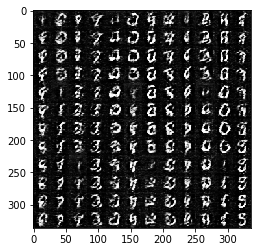

Epoch 1/2 150 steps - training losses:  discriminator: 1.2288 | generator 1.1070
Epoch 1/2 200 steps - training losses:  discriminator: 1.3117 | generator 0.7504


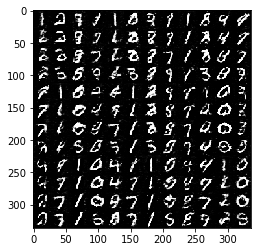

Epoch 1/2 250 steps - training losses:  discriminator: 1.1379 | generator 0.9801
Epoch 1/2 300 steps - training losses:  discriminator: 1.2111 | generator 1.1932


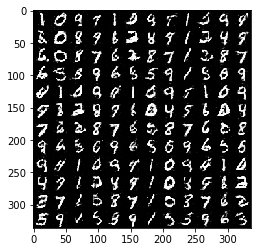

Epoch 1/2 350 steps - training losses:  discriminator: 1.1744 | generator 0.8743
Epoch 1/2 400 steps - training losses:  discriminator: 1.2189 | generator 0.7532


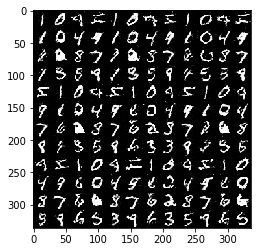

Epoch 1/2 450 steps - training losses:  discriminator: 1.0958 | generator 0.9753
Epoch 1/2 500 steps - training losses:  discriminator: 1.1576 | generator 1.4810


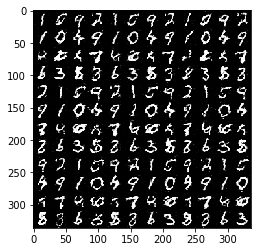

Epoch 1/2 550 steps - training losses:  discriminator: 0.9948 | generator 1.1625
Epoch 1/2 600 steps - training losses:  discriminator: 1.2600 | generator 0.5768


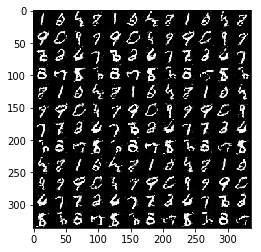

Epoch 1/2 650 steps - training losses:  discriminator: 1.0513 | generator 1.0860
Epoch 1/2 700 steps - training losses:  discriminator: 1.0729 | generator 0.7335


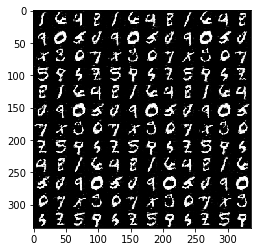

Epoch 1/2 750 steps - training losses:  discriminator: 1.0528 | generator 0.8091
Epoch 1/2 800 steps - training losses:  discriminator: 0.8592 | generator 1.4015


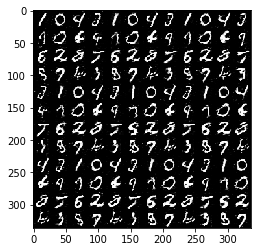

Epoch 1/2 850 steps - training losses:  discriminator: 1.0628 | generator 0.8388
Epoch 1/2 900 steps - training losses:  discriminator: 0.8495 | generator 1.6161


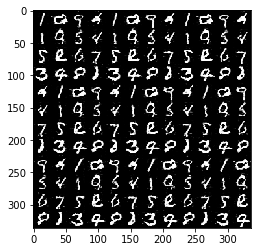

Epoch 1/2 950 steps - training losses:  discriminator: 0.9072 | generator 1.2006
Epoch 1/2 1000 steps - training losses:  discriminator: 0.9972 | generator 0.9042


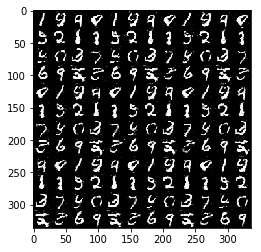

Epoch 1/2 1050 steps - training losses:  discriminator: 1.0539 | generator 0.7667
Epoch 1/2 1100 steps - training losses:  discriminator: 1.0717 | generator 0.7881


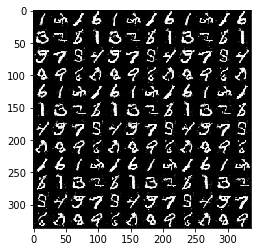

Epoch 1/2 1150 steps - training losses:  discriminator: 1.2250 | generator 0.6579
Epoch 1/2 1200 steps - training losses:  discriminator: 0.9894 | generator 0.9482


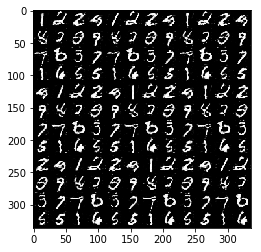

Epoch 1/2 1250 steps - training losses:  discriminator: 0.9331 | generator 0.9592
Epoch 1/2 1300 steps - training losses:  discriminator: 0.7004 | generator 1.5524


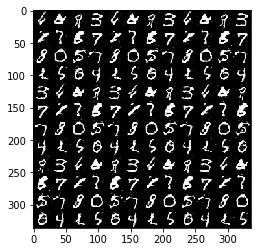

Epoch 1/2 1350 steps - training losses:  discriminator: 0.8331 | generator 1.7623
Epoch 1/2 1400 steps - training losses:  discriminator: 0.7888 | generator 1.4408


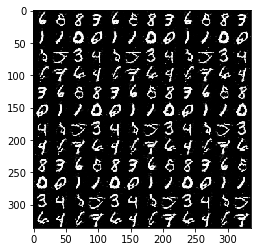

Epoch 1/2 1450 steps - training losses:  discriminator: 0.9759 | generator 0.9680
Epoch 1/2 1500 steps - training losses:  discriminator: 0.8754 | generator 1.2357


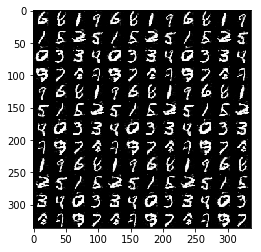

Epoch 1/2 1550 steps - training losses:  discriminator: 1.2289 | generator 0.5928
Epoch 1/2 1600 steps - training losses:  discriminator: 1.0174 | generator 0.9710


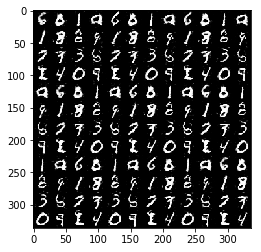

Epoch 1/2 1650 steps - training losses:  discriminator: 1.0176 | generator 0.8516
Epoch 1/2 1700 steps - training losses:  discriminator: 0.7511 | generator 1.2855


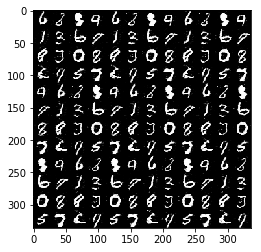

Epoch 1/2 1750 steps - training losses:  discriminator: 0.9006 | generator 1.0390
Epoch 1/2 1800 steps - training losses:  discriminator: 0.8288 | generator 1.1804


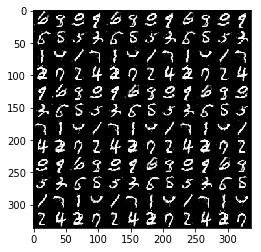

Epoch 1/2 1850 steps - training losses:  discriminator: 0.8460 | generator 1.2156
Epoch 2/2 1900 steps - training losses:  discriminator: 0.7728 | generator 1.4325


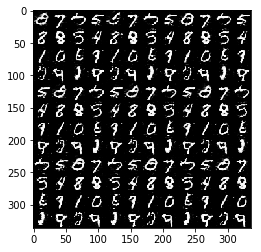

Epoch 2/2 1950 steps - training losses:  discriminator: 0.6984 | generator 1.6717
Epoch 2/2 2000 steps - training losses:  discriminator: 0.6365 | generator 1.7865


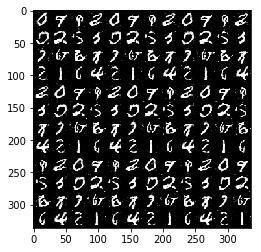

Epoch 2/2 2050 steps - training losses:  discriminator: 0.7219 | generator 1.4502
Epoch 2/2 2100 steps - training losses:  discriminator: 0.7224 | generator 1.5746


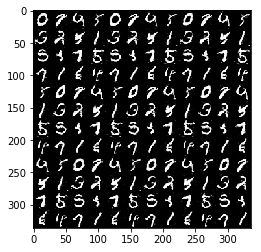

Epoch 2/2 2150 steps - training losses:  discriminator: 0.7607 | generator 1.3709
Epoch 2/2 2200 steps - training losses:  discriminator: 0.7393 | generator 1.9334


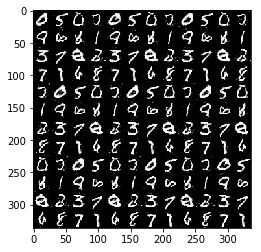

Epoch 2/2 2250 steps - training losses:  discriminator: 0.8384 | generator 1.0941
Epoch 2/2 2300 steps - training losses:  discriminator: 0.7431 | generator 1.5847


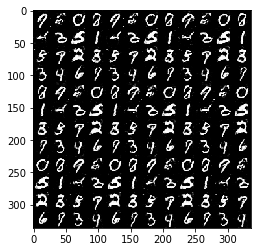

Epoch 2/2 2350 steps - training losses:  discriminator: 0.6932 | generator 1.5482
Epoch 2/2 2400 steps - training losses:  discriminator: 0.6364 | generator 1.6980


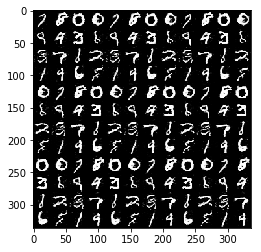

Epoch 2/2 2450 steps - training losses:  discriminator: 0.8401 | generator 1.2212
Epoch 2/2 2500 steps - training losses:  discriminator: 0.6140 | generator 1.8489


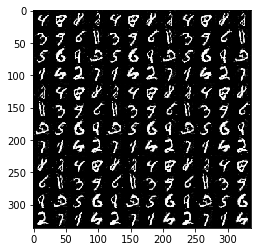

Epoch 2/2 2550 steps - training losses:  discriminator: 0.6022 | generator 2.0359
Epoch 2/2 2600 steps - training losses:  discriminator: 0.6934 | generator 1.8177


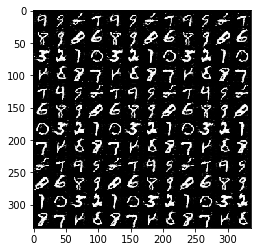

Epoch 2/2 2650 steps - training losses:  discriminator: 0.8008 | generator 1.3501
Epoch 2/2 2700 steps - training losses:  discriminator: 0.4971 | generator 2.5461


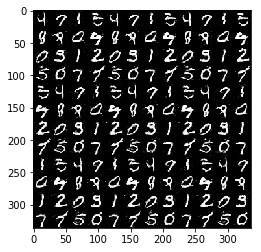

Epoch 2/2 2750 steps - training losses:  discriminator: 0.7164 | generator 1.4532
Epoch 2/2 2800 steps - training losses:  discriminator: 0.6269 | generator 2.0600


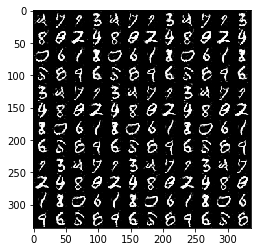

Epoch 2/2 2850 steps - training losses:  discriminator: 0.8313 | generator 2.6992
Epoch 2/2 2900 steps - training losses:  discriminator: 0.9099 | generator 1.0564


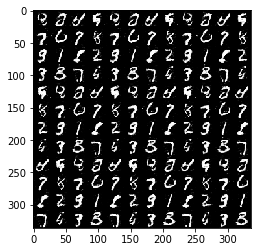

Epoch 2/2 2950 steps - training losses:  discriminator: 0.6744 | generator 2.2471
Epoch 2/2 3000 steps - training losses:  discriminator: 0.6557 | generator 1.8143


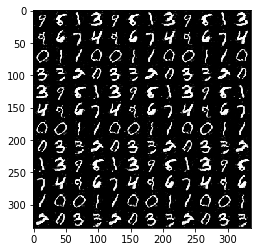

Epoch 2/2 3050 steps - training losses:  discriminator: 0.6216 | generator 1.8958
Epoch 2/2 3100 steps - training losses:  discriminator: 0.6309 | generator 1.8293


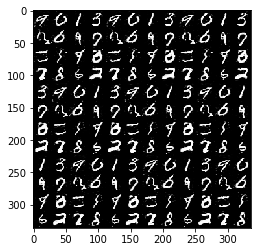

Epoch 2/2 3150 steps - training losses:  discriminator: 0.6781 | generator 1.7224
Epoch 2/2 3200 steps - training losses:  discriminator: 0.6470 | generator 1.8593


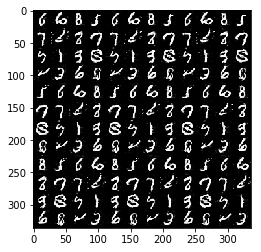

Epoch 2/2 3250 steps - training losses:  discriminator: 0.6334 | generator 2.1446
Epoch 2/2 3300 steps - training losses:  discriminator: 0.5884 | generator 1.8573


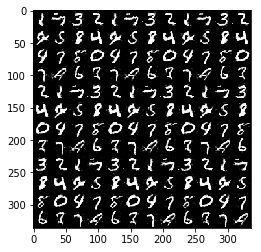

Epoch 2/2 3350 steps - training losses:  discriminator: 0.6448 | generator 2.0770
Epoch 2/2 3400 steps - training losses:  discriminator: 0.6281 | generator 1.9032


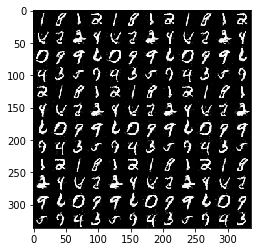

Epoch 2/2 3450 steps - training losses:  discriminator: 0.5596 | generator 2.2565
Epoch 2/2 3500 steps - training losses:  discriminator: 0.7269 | generator 2.9894


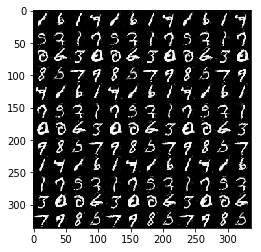

Epoch 2/2 3550 steps - training losses:  discriminator: 0.6501 | generator 1.6731
Epoch 2/2 3600 steps - training losses:  discriminator: 0.5427 | generator 2.2738


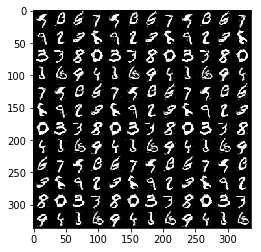

Epoch 2/2 3650 steps - training losses:  discriminator: 0.6819 | generator 1.6551
Epoch 2/2 3700 steps - training losses:  discriminator: 0.6265 | generator 2.6355


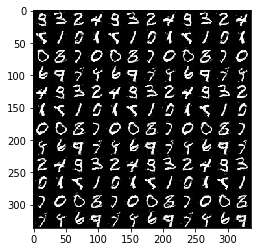

Epoch 2/2 3750 steps - training losses:  discriminator: 0.7008 | generator 2.6546


In [12]:
batch_size = 32
z_dim = 100 
learning_rate = 0.0002
beta1 = 0.4 


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 50 steps - training losses:  discriminator: 2.0967 | generator 0.2332
Epoch 1/1 100 steps - training losses:  discriminator: 1.8100 | generator 0.5387


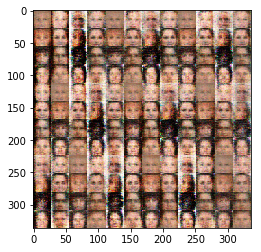

Epoch 1/1 150 steps - training losses:  discriminator: 0.5621 | generator 2.1831
Epoch 1/1 200 steps - training losses:  discriminator: 3.3724 | generator 0.0810


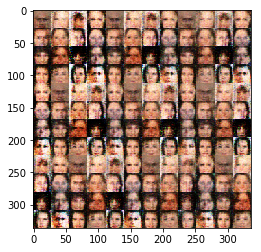

Epoch 1/1 250 steps - training losses:  discriminator: 0.6318 | generator 3.0590
Epoch 1/1 300 steps - training losses:  discriminator: 0.5396 | generator 2.2330


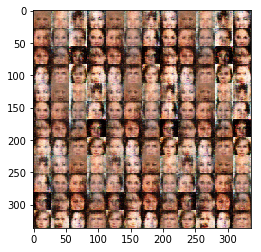

Epoch 1/1 350 steps - training losses:  discriminator: 0.6811 | generator 4.0235
Epoch 1/1 400 steps - training losses:  discriminator: 0.5649 | generator 1.8546


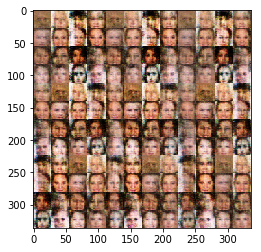

Epoch 1/1 450 steps - training losses:  discriminator: 0.4111 | generator 3.2441
Epoch 1/1 500 steps - training losses:  discriminator: 0.4315 | generator 3.1311


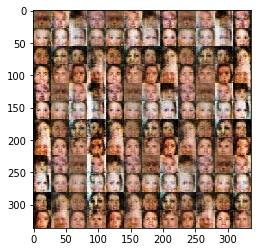

Epoch 1/1 550 steps - training losses:  discriminator: 0.4121 | generator 2.8857
Epoch 1/1 600 steps - training losses:  discriminator: 0.4083 | generator 3.4749


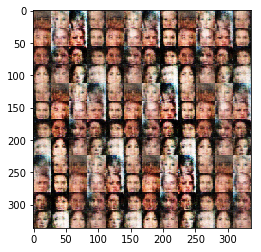

Epoch 1/1 650 steps - training losses:  discriminator: 0.5915 | generator 3.7503
Epoch 1/1 700 steps - training losses:  discriminator: 0.3837 | generator 3.8064


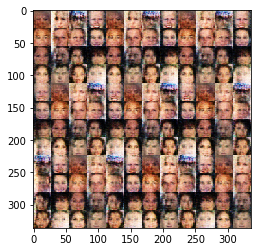

Epoch 1/1 750 steps - training losses:  discriminator: 0.4323 | generator 3.2268
Epoch 1/1 800 steps - training losses:  discriminator: 0.3801 | generator 3.8267


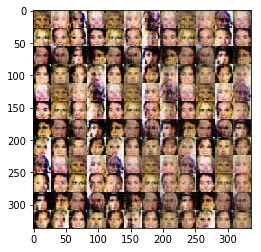

Epoch 1/1 850 steps - training losses:  discriminator: 0.3670 | generator 4.1457
Epoch 1/1 900 steps - training losses:  discriminator: 0.4398 | generator 2.8108


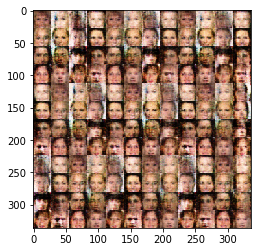

Epoch 1/1 950 steps - training losses:  discriminator: 0.4432 | generator 3.2906
Epoch 1/1 1000 steps - training losses:  discriminator: 0.4014 | generator 3.2460


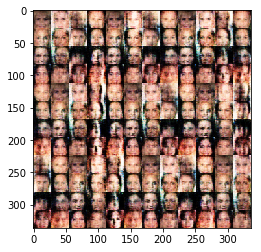

Epoch 1/1 1050 steps - training losses:  discriminator: 0.4164 | generator 3.2218
Epoch 1/1 1100 steps - training losses:  discriminator: 0.4121 | generator 3.5319


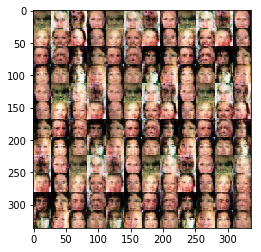

Epoch 1/1 1150 steps - training losses:  discriminator: 0.4032 | generator 3.3282
Epoch 1/1 1200 steps - training losses:  discriminator: 0.4442 | generator 2.8444


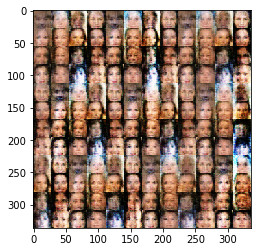

Epoch 1/1 1250 steps - training losses:  discriminator: 0.3762 | generator 3.8289
Epoch 1/1 1300 steps - training losses:  discriminator: 0.3949 | generator 3.8282


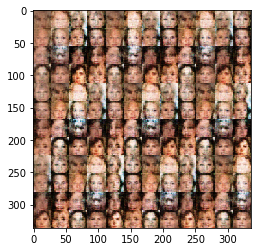

Epoch 1/1 1350 steps - training losses:  discriminator: 0.3782 | generator 4.1964
Epoch 1/1 1400 steps - training losses:  discriminator: 0.4984 | generator 2.3085


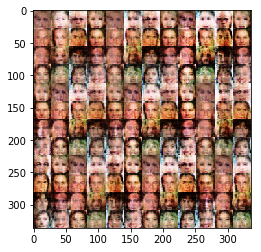

Epoch 1/1 1450 steps - training losses:  discriminator: 0.3727 | generator 3.7643
Epoch 1/1 1500 steps - training losses:  discriminator: 0.3785 | generator 4.0312


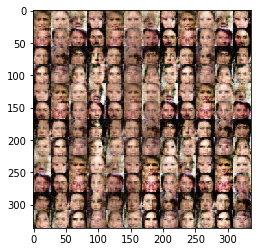

Epoch 1/1 1550 steps - training losses:  discriminator: 0.3673 | generator 4.2299
Epoch 1/1 1600 steps - training losses:  discriminator: 0.4058 | generator 3.6658


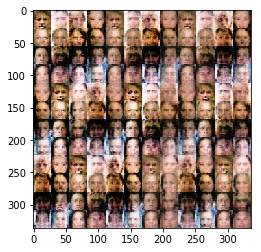

Epoch 1/1 1650 steps - training losses:  discriminator: 0.4283 | generator 3.5640
Epoch 1/1 1700 steps - training losses:  discriminator: 0.3936 | generator 3.9574


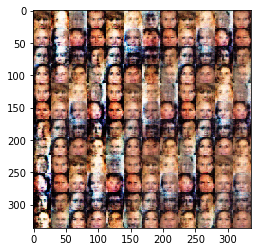

Epoch 1/1 1750 steps - training losses:  discriminator: 0.3954 | generator 3.8699
Epoch 1/1 1800 steps - training losses:  discriminator: 0.3900 | generator 3.7606


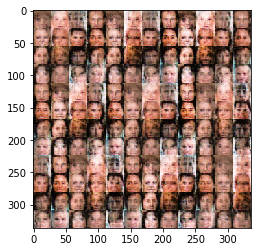

Epoch 1/1 1850 steps - training losses:  discriminator: 0.3663 | generator 4.3346
Epoch 1/1 1900 steps - training losses:  discriminator: 0.4321 | generator 3.2545


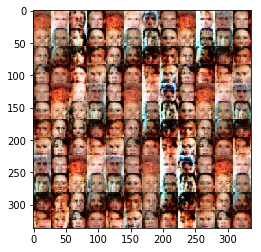

Epoch 1/1 1950 steps - training losses:  discriminator: 0.3835 | generator 3.7886
Epoch 1/1 2000 steps - training losses:  discriminator: 0.3782 | generator 4.1267


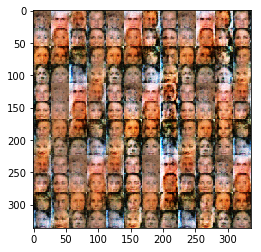

Epoch 1/1 2050 steps - training losses:  discriminator: 1.0515 | generator 0.9901
Epoch 1/1 2100 steps - training losses:  discriminator: 0.3892 | generator 4.7562


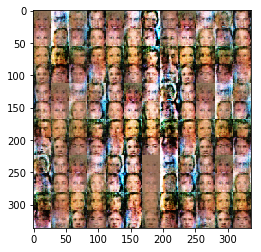

Epoch 1/1 2150 steps - training losses:  discriminator: 0.3790 | generator 3.8203
Epoch 1/1 2200 steps - training losses:  discriminator: 0.5648 | generator 1.8804


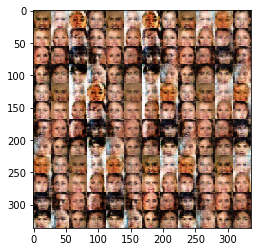

Epoch 1/1 2250 steps - training losses:  discriminator: 0.3735 | generator 3.9248
Epoch 1/1 2300 steps - training losses:  discriminator: 0.3949 | generator 3.8591


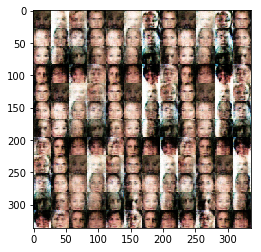

Epoch 1/1 2350 steps - training losses:  discriminator: 0.4823 | generator 3.9949
Epoch 1/1 2400 steps - training losses:  discriminator: 1.6446 | generator 0.5235


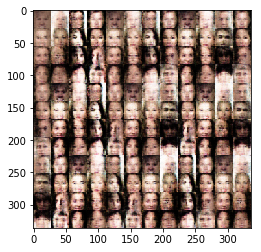

Epoch 1/1 2450 steps - training losses:  discriminator: 0.3945 | generator 3.8682
Epoch 1/1 2500 steps - training losses:  discriminator: 0.3634 | generator 4.5613


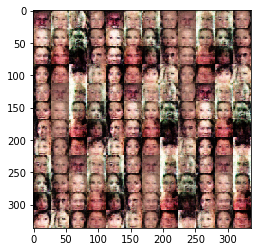

Epoch 1/1 2550 steps - training losses:  discriminator: 0.3907 | generator 4.1970
Epoch 1/1 2600 steps - training losses:  discriminator: 0.3717 | generator 3.8501


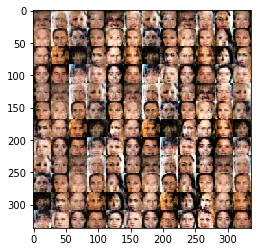

Epoch 1/1 2650 steps - training losses:  discriminator: 0.4291 | generator 3.1220
Epoch 1/1 2700 steps - training losses:  discriminator: 0.4563 | generator 2.6657


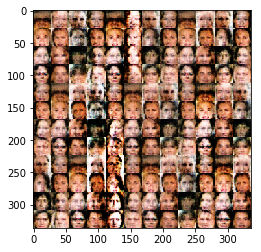

Epoch 1/1 2750 steps - training losses:  discriminator: 0.4719 | generator 2.5557
Epoch 1/1 2800 steps - training losses:  discriminator: 0.3703 | generator 3.9708


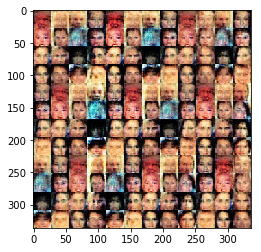

Epoch 1/1 2850 steps - training losses:  discriminator: 0.4206 | generator 3.1073
Epoch 1/1 2900 steps - training losses:  discriminator: 0.4711 | generator 3.2874


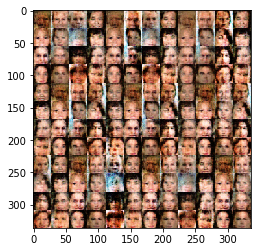

Epoch 1/1 2950 steps - training losses:  discriminator: 0.3729 | generator 3.9439
Epoch 1/1 3000 steps - training losses:  discriminator: 0.3548 | generator 4.5915


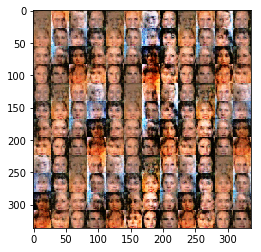

Epoch 1/1 3050 steps - training losses:  discriminator: 0.3645 | generator 4.3364
Epoch 1/1 3100 steps - training losses:  discriminator: 0.4608 | generator 2.8007


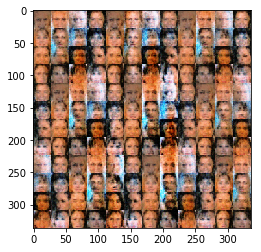

Epoch 1/1 3150 steps - training losses:  discriminator: 0.4898 | generator 2.6372
Epoch 1/1 3200 steps - training losses:  discriminator: 0.3689 | generator 4.1805


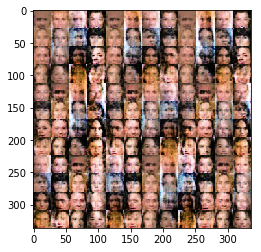

Epoch 1/1 3250 steps - training losses:  discriminator: 0.3818 | generator 3.7510
Epoch 1/1 3300 steps - training losses:  discriminator: 0.4694 | generator 3.7882


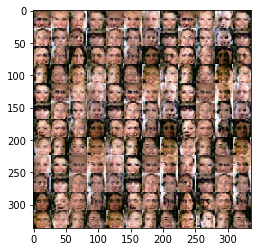

Epoch 1/1 3350 steps - training losses:  discriminator: 3.8079 | generator 0.0890
Epoch 1/1 3400 steps - training losses:  discriminator: 0.3717 | generator 4.2452


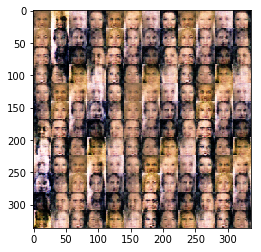

Epoch 1/1 3450 steps - training losses:  discriminator: 0.4329 | generator 3.9112
Epoch 1/1 3500 steps - training losses:  discriminator: 0.3616 | generator 4.7958


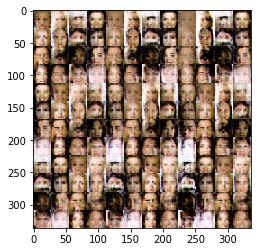

Epoch 1/1 3550 steps - training losses:  discriminator: 0.4288 | generator 3.1042
Epoch 1/1 3600 steps - training losses:  discriminator: 0.3803 | generator 4.2797


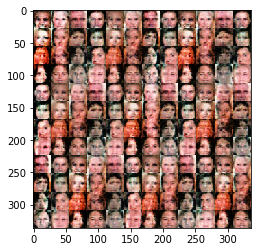

Epoch 1/1 3650 steps - training losses:  discriminator: 0.3717 | generator 4.1681
Epoch 1/1 3700 steps - training losses:  discriminator: 0.3755 | generator 3.9908


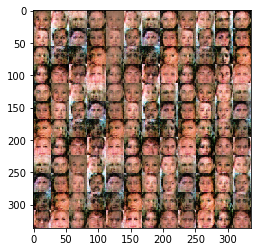

Epoch 1/1 3750 steps - training losses:  discriminator: 0.4155 | generator 3.7337
Epoch 1/1 3800 steps - training losses:  discriminator: 0.3895 | generator 3.6652


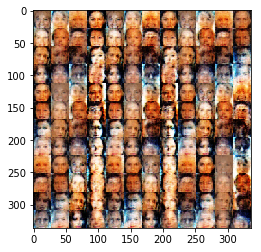

Epoch 1/1 3850 steps - training losses:  discriminator: 2.0676 | generator 5.0927
Epoch 1/1 3900 steps - training losses:  discriminator: 0.3551 | generator 5.1591


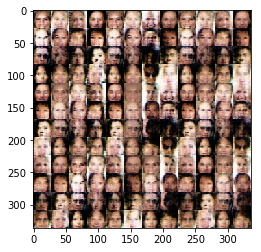

Epoch 1/1 3950 steps - training losses:  discriminator: 0.3920 | generator 3.7271
Epoch 1/1 4000 steps - training losses:  discriminator: 0.3750 | generator 4.6212


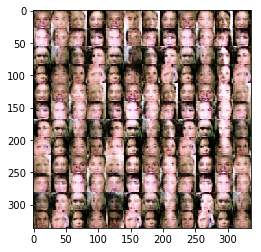

Epoch 1/1 4050 steps - training losses:  discriminator: 0.3557 | generator 4.9027
Epoch 1/1 4100 steps - training losses:  discriminator: 0.3874 | generator 3.9831


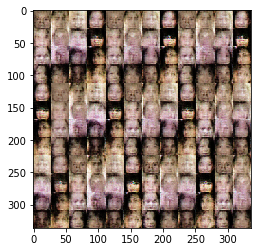

Epoch 1/1 4150 steps - training losses:  discriminator: 0.3652 | generator 4.0975
Epoch 1/1 4200 steps - training losses:  discriminator: 0.3675 | generator 4.4219


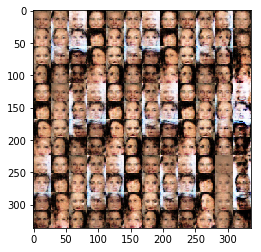

Epoch 1/1 4250 steps - training losses:  discriminator: 0.3784 | generator 4.0888
Epoch 1/1 4300 steps - training losses:  discriminator: 0.3560 | generator 5.0453


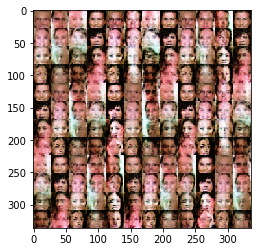

Epoch 1/1 4350 steps - training losses:  discriminator: 0.3585 | generator 4.5652
Epoch 1/1 4400 steps - training losses:  discriminator: 0.4180 | generator 3.3119


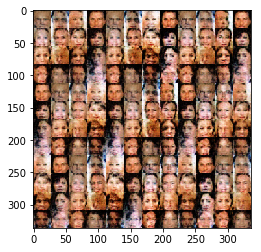

Epoch 1/1 4450 steps - training losses:  discriminator: 1.6197 | generator 0.6543
Epoch 1/1 4500 steps - training losses:  discriminator: 0.3690 | generator 4.5993


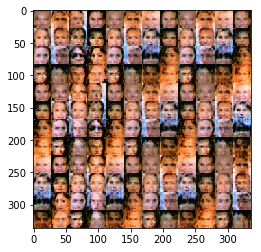

Epoch 1/1 4550 steps - training losses:  discriminator: 0.3560 | generator 4.5775
Epoch 1/1 4600 steps - training losses:  discriminator: 0.3588 | generator 4.7695


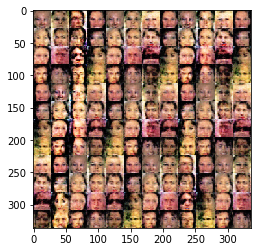

Epoch 1/1 4650 steps - training losses:  discriminator: 0.4030 | generator 3.9329
Epoch 1/1 4700 steps - training losses:  discriminator: 0.3713 | generator 4.4029


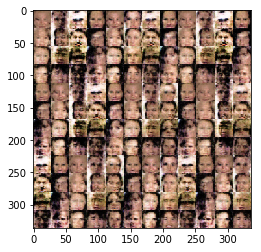

Epoch 1/1 4750 steps - training losses:  discriminator: 0.3836 | generator 3.7633
Epoch 1/1 4800 steps - training losses:  discriminator: 0.3713 | generator 4.1531


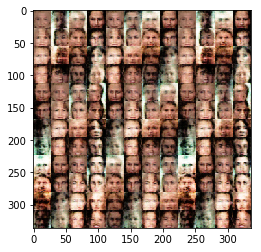

Epoch 1/1 4850 steps - training losses:  discriminator: 0.3586 | generator 4.5286
Epoch 1/1 4900 steps - training losses:  discriminator: 0.3899 | generator 3.8686


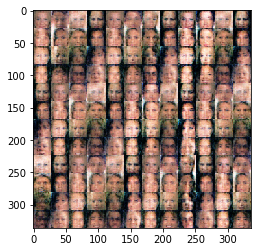

Epoch 1/1 4950 steps - training losses:  discriminator: 0.5749 | generator 1.7920
Epoch 1/1 5000 steps - training losses:  discriminator: 0.3647 | generator 4.3679


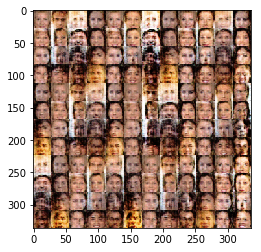

Epoch 1/1 5050 steps - training losses:  discriminator: 0.3741 | generator 4.7925
Epoch 1/1 5100 steps - training losses:  discriminator: 0.3711 | generator 4.5140


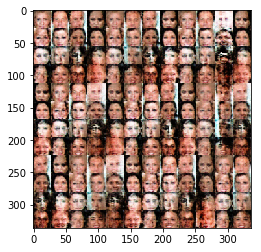

Epoch 1/1 5150 steps - training losses:  discriminator: 1.4669 | generator 3.9812
Epoch 1/1 5200 steps - training losses:  discriminator: 0.3739 | generator 4.1241


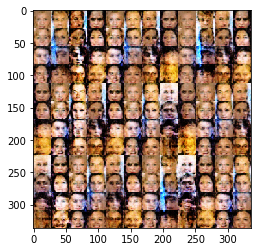

Epoch 1/1 5250 steps - training losses:  discriminator: 0.4280 | generator 4.0624
Epoch 1/1 5300 steps - training losses:  discriminator: 0.3840 | generator 3.7261


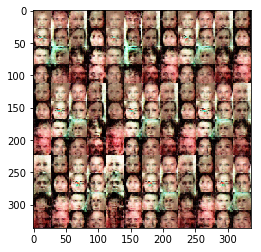

Epoch 1/1 5350 steps - training losses:  discriminator: 0.3731 | generator 3.8777
Epoch 1/1 5400 steps - training losses:  discriminator: 0.3787 | generator 3.9388


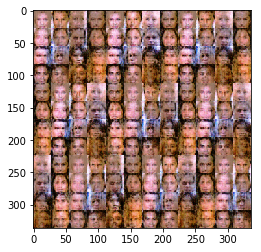

Epoch 1/1 5450 steps - training losses:  discriminator: 0.3574 | generator 4.5356
Epoch 1/1 5500 steps - training losses:  discriminator: 0.3740 | generator 3.9671


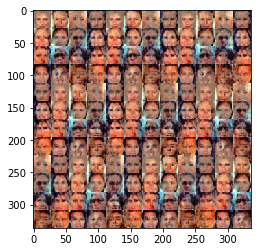

Epoch 1/1 5550 steps - training losses:  discriminator: 0.3626 | generator 5.1650
Epoch 1/1 5600 steps - training losses:  discriminator: 0.3673 | generator 4.5590


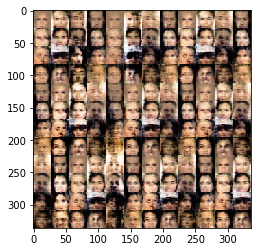

Epoch 1/1 5650 steps - training losses:  discriminator: 0.3801 | generator 5.3140
Epoch 1/1 5700 steps - training losses:  discriminator: 0.3781 | generator 3.7505


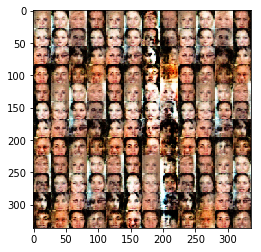

Epoch 1/1 5750 steps - training losses:  discriminator: 0.3871 | generator 4.6351
Epoch 1/1 5800 steps - training losses:  discriminator: 0.3711 | generator 4.8369


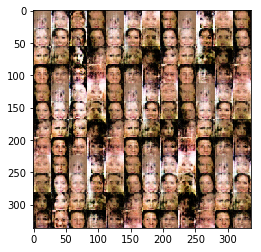

Epoch 1/1 5850 steps - training losses:  discriminator: 0.3589 | generator 4.2105
Epoch 1/1 5900 steps - training losses:  discriminator: 0.3657 | generator 5.3723


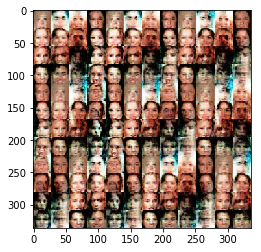

Epoch 1/1 5950 steps - training losses:  discriminator: 0.3834 | generator 3.5610
Epoch 1/1 6000 steps - training losses:  discriminator: 0.3688 | generator 4.4968


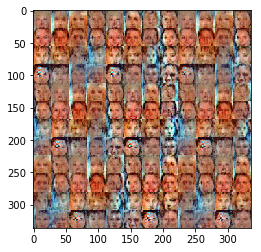

Epoch 1/1 6050 steps - training losses:  discriminator: 0.3731 | generator 4.4611
Epoch 1/1 6100 steps - training losses:  discriminator: 0.3567 | generator 4.6654


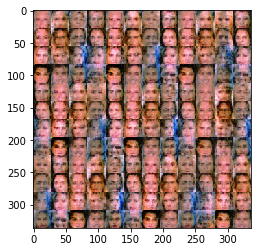

Epoch 1/1 6150 steps - training losses:  discriminator: 0.3663 | generator 4.3942
Epoch 1/1 6200 steps - training losses:  discriminator: 0.3715 | generator 4.0653


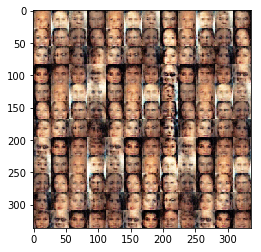

Epoch 1/1 6250 steps - training losses:  discriminator: 0.3520 | generator 4.8372
Epoch 1/1 6300 steps - training losses:  discriminator: 0.3614 | generator 4.9060


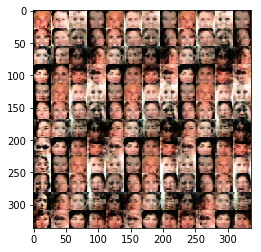

In [13]:
batch_size = 32
z_dim = 100 
learning_rate = 0.0002
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.